[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/azad-academy/denoising-diffusion-model/blob/main/diffusion_model_demo.ipynb)

# Diffusion Models Tutorial

#### Author : J. Rafid Siddiqui (jrs@azaditech.com)


## Loading Data

torch.Tensor

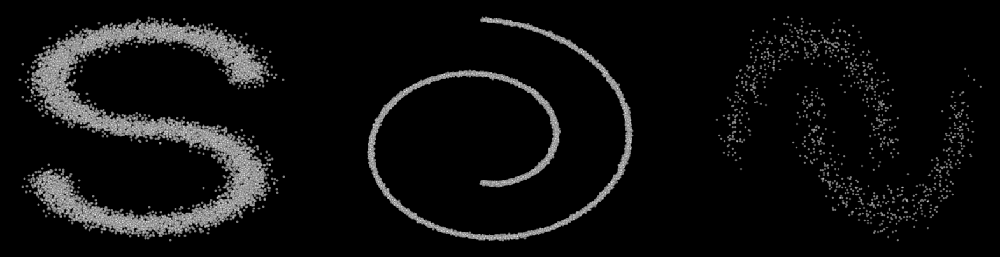

In [61]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from sklearn.datasets import make_checkerboard,make_circles,make_moons,make_s_curve,make_swiss_roll
from helper_plot import hdr_plot_style
import torch
from utils import * 

hdr_plot_style()
swiss_roll, _ = make_swiss_roll(10**4,noise=0.1)
swiss_roll = swiss_roll[:, [0, 2]]/10.0

s_curve, _= make_s_curve(10**4, noise=0.1)
s_curve = s_curve[:, [0, 2]]/10.0

moons, _ = make_moons(10**3, noise=0.1)

data = s_curve.T
#dataset = torch.Tensor(data.T).float()


fig,axes = plt.subplots(1,3,figsize=(20,5))

axes[0].scatter(*data, alpha=0.5, color='white', edgecolor='gray', s=5);
axes[0].axis('off')

data = swiss_roll.T
axes[1].scatter(*data, alpha=0.5, color='white', edgecolor='gray', s=5);
axes[1].axis('off')
#dataset = torch.Tensor(data.T).float()

data = moons.T
axes[2].scatter(*data, alpha=0.5, color='white', edgecolor='gray', s=3);
axes[2].axis('off')
dataset = torch.Tensor(data.T).float()
type(dataset)

## Diffusion Models

![diffusion-image](images/diffusion.png)

### Forward Diffusion

$$
q(\mathbf{x}_{t}\mid\mathbf{x}_{t-1}) = \mathcal{N}(\mathbf{x}_{t} ; \sqrt{1-\beta_{t}}\mathbf{x}_{t-1},\beta_{t}\mathbf{I})
$$

Substituting $\alpha_{t}=1-\beta_{t}$ and $\bar{\alpha}_{t} = \prod_{s=1}^{t} \alpha_{s}$: 

$$
q(\mathbf{x}_{t}\mid\mathbf{x}_{0}) = \mathcal{N}(\mathbf{x}_{t} ; \sqrt{\bar{\alpha}_{t}}\mathbf{x}_{t-1},(1-\bar{\alpha}_{t})\mathbf{I})
$$

Given the initial state, this makes it possible to draw sample at any desrired timestep without going through intermediate steps. Forward diffusion can also be written in terms of $x_0$ and the random noise $\epsilon \sim \mathcal{N}(0,1)$ [1]. This would be useful when performing denoising step later in the reverse diffusion.

$$
x_t(x_0,\epsilon) = \sqrt{\bar{\alpha}_{t}}\mathbf{x}_{0} + \sqrt{1-\bar{\alpha_{t}}}\epsilon          
$$

In [62]:
num_steps = 100
#betas = torch.tensor([1.7e-5] * num_steps)

#100 beta values
betas = make_beta_schedule(schedule='sigmoid', n_timesteps=num_steps, start=1e-5, end=0.5e-2)

#corresponding alpha values
alphas = 1 - betas

#100 cumulative products of the alpha values
alphas_prod = torch.cumprod(alphas, 0) 
# concatenate 1 in front of the alpha_prod, discard the last value of alpha_prod
alphas_prod_p = torch.cat([torch.tensor([1]).float(), alphas_prod[:-1]], 0)

#squared root everything for easy operation
alphas_bar_sqrt = torch.sqrt(alphas_prod)

#same rational
one_minus_alphas_bar_log = torch.log(1 - alphas_prod)
one_minus_alphas_bar_sqrt = torch.sqrt(1 - alphas_prod)

In [63]:
def q_x(x_0, t, noise=None):
    #introduce default noise
    if noise is None:
        noise = torch.randn_like(x_0)
    # essentially it just extract values in alpha_bar_sqrt indexed by t
    # reshape it to size of first dimension of t, with dimension(x_0) - 1 remaining ones.
    alphas_t = extract(alphas_bar_sqrt, t, x_0)
    alphas_1_m_t = extract(one_minus_alphas_bar_sqrt, t, x_0)
    return (alphas_t * x_0 + alphas_1_m_t * noise)

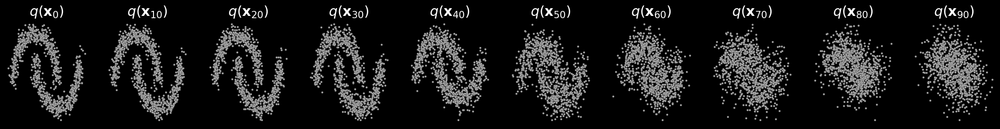

In [64]:
fig, axs = plt.subplots(1, 10, figsize=(28, 3))
for i in range(10):
    q_i = q_x(dataset, torch.tensor([i * 10]))
    axs[i].scatter(q_i[:, 0], q_i[:, 1],color='white',edgecolor='gray', s=5);
    axs[i].set_axis_off(); axs[i].set_title('$q(\mathbf{x}_{'+str(i*10)+'})$')

In [65]:
posterior_mean_coef_1 = (betas * torch.sqrt(alphas_prod_p) / (1 - alphas_prod))
posterior_mean_coef_2 = ((1 - alphas_prod_p) * torch.sqrt(alphas) / (1 - alphas_prod))
posterior_variance = betas * (1 - alphas_prod_p) / (1 - alphas_prod)
posterior_log_variance_clipped = torch.log(torch.cat((posterior_variance[1].view(1, 1), posterior_variance[1:].view(-1, 1)), 0)).view(-1)

def q_posterior_mean_variance(x_0, x_t, t):
    coef_1 = extract(posterior_mean_coef_1, t, x_0)
    coef_2 = extract(posterior_mean_coef_2, t, x_0)
    mean = coef_1 * x_0 + coef_2 * x_t
    var = extract(posterior_log_variance_clipped, t, x_0)
    return mean, var

## Reverse Diffusion/Reconstruction

Unlike the forward diffusion, the reverse diffusion process requires training of a neural network model. We setup the necessary loss functions and training parameters and then perform the training.

## Training

### Training Loss

The original loss was proposed in Sohl-Dickstein et al. [1] as following:

\begin{align}
K = -\mathbb{E}_{q}[ &D_{KL}(q(\mathbf{x}_{t-1}\mid\mathbf{x}_{t},\mathbf{x}_{0}) \Vert p_{\theta}(\mathbf{x}_{t-1}\mid\mathbf{x}_{t}))  \\
&+ H_{q}(\mathbf{X}_{T}\vert\mathbf{X}_{0}) - H_{q}(\mathbf{X}_{1}\vert\mathbf{X}_{0}) - H_{p}(\mathbf{X}_{T})]
\end{align} 


In order to improve the results, the authors in Ho et al. [2] proposed multiple improvements. Following Parameterization of mean is proposed: 

$$
\mathbf{\mu}_{\theta}(\mathbf{x}_{t}, t) = \frac{1}{\sqrt{\alpha_{t}}} \left( (\mathbf{x}_{t} - \frac{\beta_{t}}{\sqrt{1 - \bar{\alpha}}_{t}} \mathbf{\epsilon}_{\theta} (\mathbf{x}_{t}, t) \right) 
$$

further, variance is taken as constant and the step for reverse diffusion then becomes:

$$
\mathbf{x}_{t-1} = \frac{1}{\sqrt{\alpha_{t}}} \left( \mathbf{x}_{t} - \frac{1-\alpha_{t}}{\sqrt{1-\bar{\alpha_{t}}}} \mathbf{\epsilon}_{\theta}(\mathbf{x}_{t}, t) \right) + \sigma_{t}\mathbf{z}
$$



After further improvements and simplifications the loss function becomes:

$$
\mathcal{L}_{\text{simple}}=\mathbb{E}_{t, \mathbf{x}_{0},\mathbf{\epsilon}}\left[ \Vert \epsilon - \epsilon_{\theta}(\sqrt{\bar{\alpha}_{t}}\mathbf{x}_{0} + \sqrt{1 - \bar{\alpha}_{t}}\mathbf{\epsilon}, t) \Vert^{2} \right].
$$

In [169]:
def calculate_hellinger(p_recon,p_orig):
    rootdifference = (np.sqrt(p_recon)-np.sqrt(p_orig))**2
    return 1/np.sqrt(2) * np.sqrt(np.sum(rootdifference))

In [170]:
def center_moon(data):
    means = np.mean(data,axis=0)
    xmean = means[0]
    ymean = means[1]
    data = data - np.mean(data,axis=0)
    return data, xmean, ymean

def uncenter_moon(data, xmean, ymean):
    data[:,0] = data[:,0] + xmean
    data[:,1] = data[:,1] + ymean
    return data

def rotate_data(data,radian):
    rotational_matrix = np.array([[np.cos(radian),-np.sin(radian)],[np.sin(radian),np.cos(radian)]])
    return (np.matmul(rotational_matrix, data.T)).T

def make_ood(numood,radian):
    standardmoon,_ = make_moons(numood, noise=0.1)
    ood, xmean, ymean = center_moon(standardmoon)
    ood = rotate_data(ood, radian)
    ood = uncenter_moon(ood, xmean, ymean)
    return ood

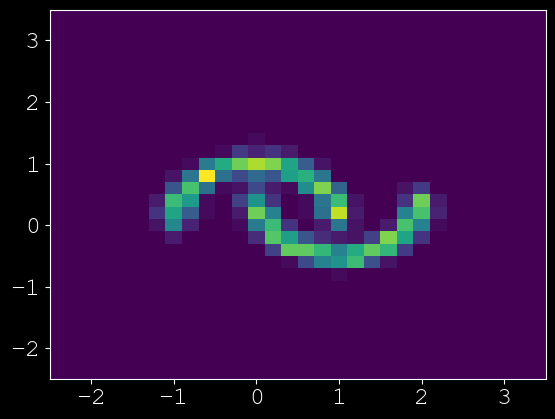

In [226]:
#generate training data for the diffusion model. Each has 10000 samples, but different m/n ratio. OOD sample is rotated 90 degrees.

#data is of shape 10000*2
numtarget = 1500
newmoon,_ = make_moons(numtarget, noise=0.1)
target = newmoon

#make ood set
ood = make_ood(4000, -np.pi/4)

#make target p
x_binedge = np.linspace(-2.5,3.5,31)
y_binedge = np.linspace(-2.5,3.5,31)
h_orig,xbin2,ybin2,img = plt.hist2d(target[:,0],target[:,1], bins=[x_binedge,y_binedge])
p_orig = h_orig/numtarget


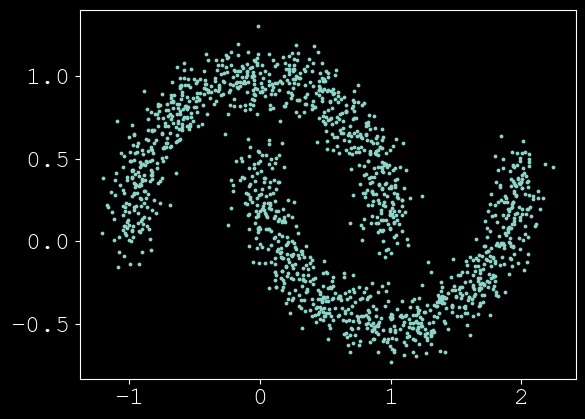

In [227]:
#show distributions
plt.scatter(target[:,0],target[:,1],s=3)

In [12]:
# newlist = []
# newlist.append(h_reconstructed/10000)
# newlist.append(h_reconstructed2/10000)
# reshaped = np.array(newlist).reshape(-1, newlist[0].shape[0])
# # np.savetxt("data.csv",reshaped,delimiter=",",fmt="%f")
# # reshaped.shape

In [228]:
#mix target and ood sample

def mix_samples(target, num_target, mnratio,radian):

    #assign target and ood sample size with given mnratio
    numood = int(num_target * mnratio)
    if (mnratio<0):
        print("mnratio must be nonnegative")
        return 0


    if (numood!=0):
        oodset = make_ood(numood, radian)
        return np.append(target, oodset, axis=0)
    else:
        return target        



(4500, 2)

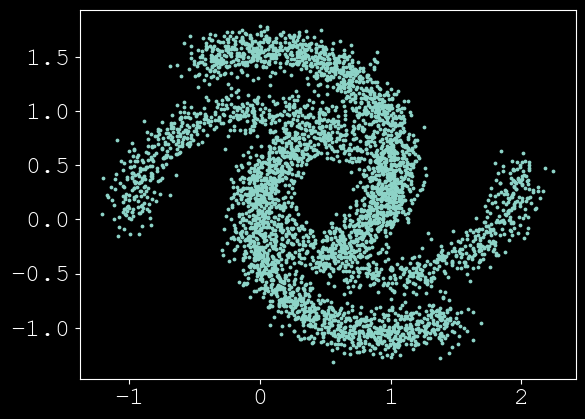

In [235]:
samples = mix_samples(target, numtarget,2,-np.pi/3)
plt.scatter(*samples.T,s=3)
samples.shape

In [230]:
#reinitialize the list of values
all_list = []
size_list = []

tensor(0.7330, grad_fn=<MeanBackward0>)
tensor(0.5082, grad_fn=<MeanBackward0>)
tensor(0.9839, grad_fn=<MeanBackward0>)
tensor(0.8596, grad_fn=<MeanBackward0>)
tensor(0.9572, grad_fn=<MeanBackward0>)
tensor(0.6286, grad_fn=<MeanBackward0>)
tensor(0.8261, grad_fn=<MeanBackward0>)
tensor(0.8591, grad_fn=<MeanBackward0>)
tensor(0.7536, grad_fn=<MeanBackward0>)
tensor(0.8461, grad_fn=<MeanBackward0>)
tensor(0.8135, grad_fn=<MeanBackward0>)
tensor(0.9504, grad_fn=<MeanBackward0>)
tensor(1.2872, grad_fn=<MeanBackward0>)
tensor(0.6166, grad_fn=<MeanBackward0>)
tensor(0.7882, grad_fn=<MeanBackward0>)
tensor(0.7611, grad_fn=<MeanBackward0>)
tensor(0.6189, grad_fn=<MeanBackward0>)
tensor(0.7034, grad_fn=<MeanBackward0>)
tensor(0.7690, grad_fn=<MeanBackward0>)
tensor(0.7683, grad_fn=<MeanBackward0>)
tensor(0.7930, grad_fn=<MeanBackward0>)


C:\Users\TravisYou\AppData\Local\Temp\ipykernel_19796\1055605973.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, 10, figsize=(28, 3))


tensor(0.7655, grad_fn=<MeanBackward0>)
tensor(0.8873, grad_fn=<MeanBackward0>)
tensor(0.2663, grad_fn=<MeanBackward0>)
tensor(0.8345, grad_fn=<MeanBackward0>)
tensor(0.8167, grad_fn=<MeanBackward0>)
tensor(0.3544, grad_fn=<MeanBackward0>)
tensor(0.7705, grad_fn=<MeanBackward0>)
tensor(0.8579, grad_fn=<MeanBackward0>)
tensor(0.6213, grad_fn=<MeanBackward0>)
tensor(0.9041, grad_fn=<MeanBackward0>)
tensor(0.7894, grad_fn=<MeanBackward0>)
tensor(0.8592, grad_fn=<MeanBackward0>)
tensor(0.7995, grad_fn=<MeanBackward0>)
tensor(0.8289, grad_fn=<MeanBackward0>)
tensor(0.7390, grad_fn=<MeanBackward0>)
tensor(0.7597, grad_fn=<MeanBackward0>)
tensor(0.7502, grad_fn=<MeanBackward0>)
tensor(0.7177, grad_fn=<MeanBackward0>)
tensor(0.8257, grad_fn=<MeanBackward0>)
tensor(0.3427, grad_fn=<MeanBackward0>)
tensor(0.6771, grad_fn=<MeanBackward0>)
tensor(0.6249, grad_fn=<MeanBackward0>)
tensor(0.8976, grad_fn=<MeanBackward0>)
tensor(0.6742, grad_fn=<MeanBackward0>)
tensor(0.4053, grad_fn=<MeanBackward0>)


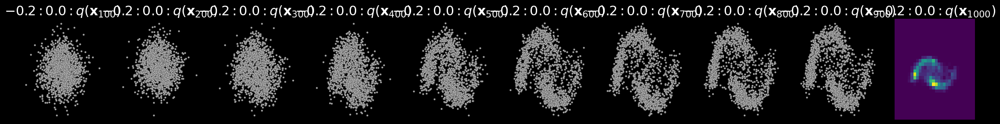

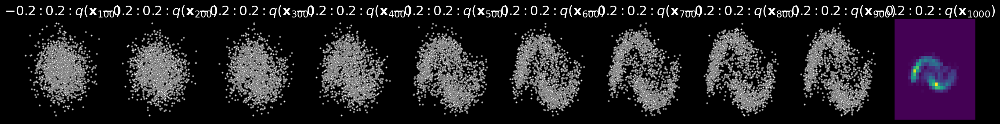

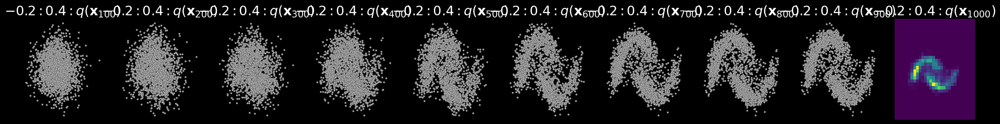

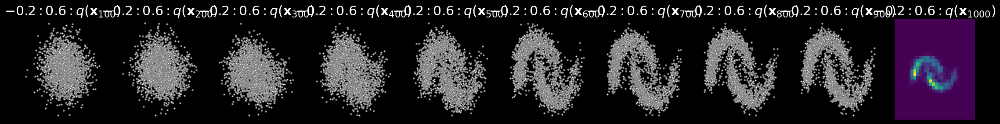

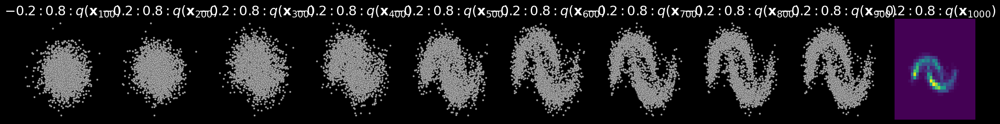

...

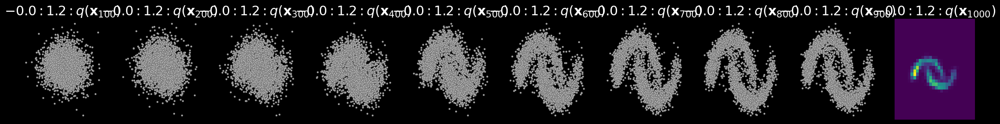

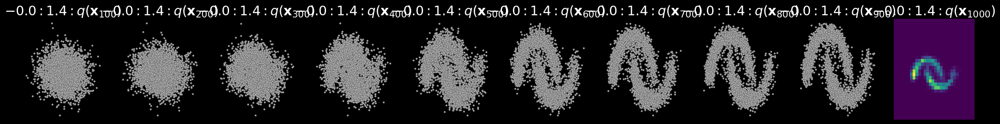

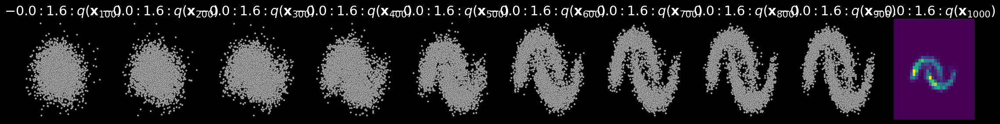

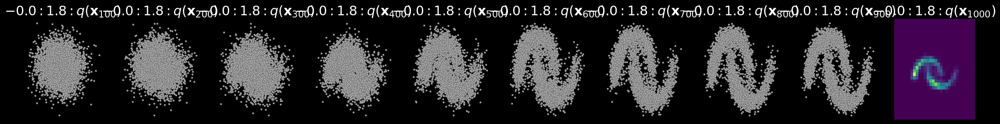

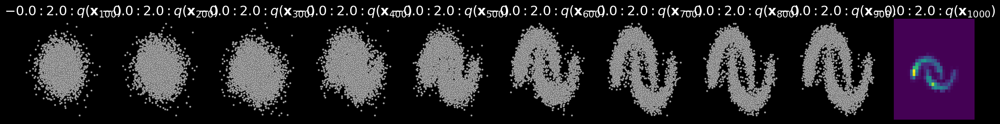

In [231]:
from model import ConditionalModel
from ema import EMA
import torch.optim as optim
import csv
checklist = []
for angle in np.linspace(-np.pi*3/32, -np.pi/32, 5):
    p_recon_list = []
    for mnratio in np.linspace(0,2,11):
        #setup training data
        rawset = mix_samples(target, numtarget, mnratio, angle)
        trainingset = torch.tensor(rawset).float()
        checklist.append(trainingset.size())
        model = ConditionalModel(num_steps)
        optimizer = optim.Adam(model.parameters(), lr=1e-3)
        #dataset = torch.tensor(data.T).float()
        # Create EMA model
        ema = EMA(0.9)
        ema.register(model)
        # Batch size
        batch_size = 128
        for t in range(1000):
            # X is a torch Variable
            permutation = torch.randperm(trainingset.size()[0])
            for i in range(0, trainingset.size()[0], batch_size):
                # Retrieve current batch
                indices = permutation[i:i+batch_size]
                batch_x = trainingset[indices]
                # Compute the loss.
                loss = noise_estimation_loss(model, batch_x,alphas_bar_sqrt,one_minus_alphas_bar_sqrt,num_steps)
                # Before the backward pass, zero all of the network gradients
                optimizer.zero_grad()
                # Backward pass: compute gradient of the loss with respect to parameters
                loss.backward()
                # Perform gradient clipping
                torch.nn.utils.clip_grad_norm_(model.parameters(), 1.)
                # Calling the step function to update the parameters
                optimizer.step()
                # Update the exponential moving average
                ema.update(model)
            # Print loss
            if (t == 999):
                print(loss)
                x_seq = p_sample_loop(model, trainingset.shape,num_steps,alphas,betas,one_minus_alphas_bar_sqrt)
                fig, axs = plt.subplots(1, 10, figsize=(28, 3))
                for i in range(1, 11):
                    cur_x = x_seq[i * 10].detach()
                    axs[i-1].scatter(cur_x[:, 0], cur_x[:, 1],color='white',edgecolor='gray', s=5);
                    axs[i-1].set_axis_off(); 
                    axs[i-1].set_title('${'+ str(angle)[:4]+':' +str(mnratio)[:3]+'}'+':q(\mathbf{x}_{'+str(i*100)+'})$')

        numiter = 20
        noisesize = (2000,2)
        collector = np.zeros((30,30))
        for ite in range(numiter):
            result = torch.randn(noisesize) # skeptical
            for i in reversed(range(100)):
                result = p_sample(model, result, i,alphas,betas,one_minus_alphas_bar_sqrt)
            result = np.array(result.detach())
            if (ite != numiter-1):
                h_reconstructed,xbin1,ybin1,img = plt.hist2d(result[:,0],result[:,1],bins=[x_binedge,y_binedge], visible = False)
            else:
                h_reconstructed,xbin1,ybin1,img = plt.hist2d(result[:,0],result[:,1],bins=[x_binedge,y_binedge], visible = True)
            p_reconstructed = h_reconstructed/noisesize[0]
            collector += p_reconstructed

        collector = collector / numiter
        
        # h_reconstructed,xbin1,ybin1,img = plt.hist2d(result[:,0],result[:,1],bins=[x_binedge,y_binedge])
        # p_reconstructed = h_reconstructed/trainingset.size()[0]
        p_recon_list.append(collector)

        f = open('data_1500_mn0_2_11_pi332132_5_iter20_noise2000.csv','ab')
        np.savetxt(f, [str(numtarget), str(mnratio)[:5], str(angle)[:5]],'%s')
        np.savetxt(f, p_reconstructed, fmt='%f')
        f.close()
    all_list.append(p_recon_list)
    size_list.append(numtarget)




[0.34859980870075474, 0.35660850370985064, 0.2979453428427559, 0.2694920596856927, 0.3050336165239191, 0.29326389004992487, 0.3020356596422708, 0.30047325617059834, 0.29796403876103156, 0.2936297735235633, 0.2976331991819911]


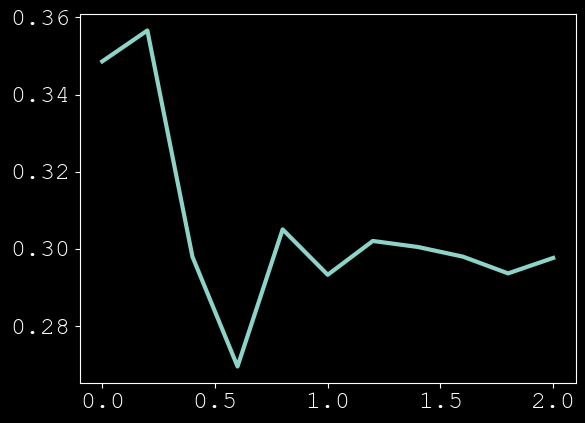

In [202]:
dist_list = []
datalist = all_list[-1]
for i in range(len(datalist)):
    dist_list.append(calculate_hellinger(datalist[i], p_orig))
print(dist_list)
plt.plot(np.linspace(0,2,11),dist_list)

In [232]:
dim2list = []
for i in range(len(all_list)):
    datalist = all_list[i]
    dist_list = []
    for i in range(len(datalist)):
        dist_list.append(calculate_hellinger(datalist[i], p_orig))
    dim2list.append(dist_list)


In [233]:
for i in range(len(dim2list)):
    fd = open('distance_1500_mn0_2_11_pi332132_5_iter20_noise2000.csv','ab')
    np.savetxt(fd,['target:'+ str(numtarget)+';angle:'+str(np.linspace(-np.pi*3/32, -np.pi/32, 5)[i])[:4]],'%s')
    np.savetxt(fd, [dim2list[i]],'%f')
    fd.close()

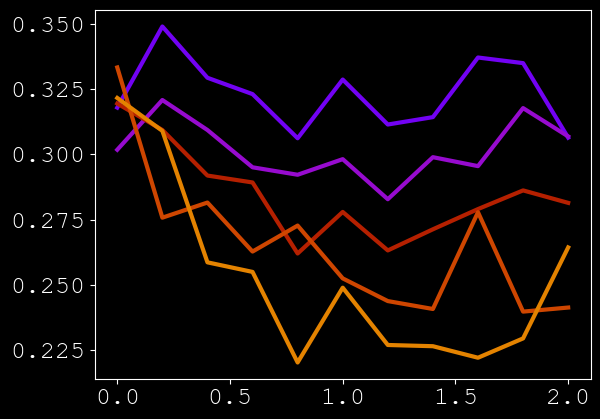

In [234]:
cmap = [plt.cm.gnuplot(i) for i in np.linspace(0.2, 0.8, len(dim2list))]
for i in range(len(dim2list)):
    plt.plot(np.linspace(0,2,11), dim2list[i],c=cmap[i], lw=3, label=str(-i*np.pi/16)[:4])

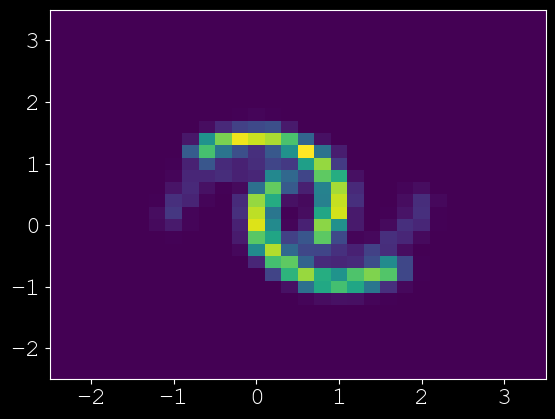

In [223]:
#check benchmark hellinger distance
helling_list = []
for rad in np.linspace(0, -np.pi/4, 5):
    temp = []
    for ratio in np.linspace(0,6,31):
        targetood = mix_samples(target, 1000, ratio, rad)
        h_recon, xbin, ybin, img = plt.hist2d(targetood[:,0], targetood[:,1],bins=[x_binedge, y_binedge])
        p_recon = h_recon / targetood.shape[0]
        temp.append(calculate_hellinger(p_recon, p_orig))
    helling_list.append(temp)

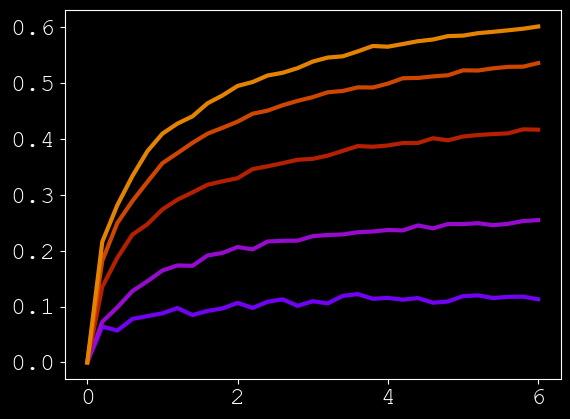

In [224]:
cmap = [plt.cm.gnuplot(i) for i in np.linspace(0.2, 0.8, len(helling_list))]
for i in range(len(helling_list)):
    plt.plot(np.linspace(0,6,31), helling_list[i],c=cmap[i], lw=3, label=str(-i*np.pi/16)[:4])

In [209]:
print(checklist)

[torch.Size([1500, 2]), torch.Size([1800, 2]), torch.Size([2100, 2]), torch.Size([2400, 2]), torch.Size([2700, 2]), torch.Size([3000, 2]), torch.Size([3300, 2]), torch.Size([3600, 2]), torch.Size([3900, 2]), torch.Size([4200, 2]), torch.Size([4500, 2])]


1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0


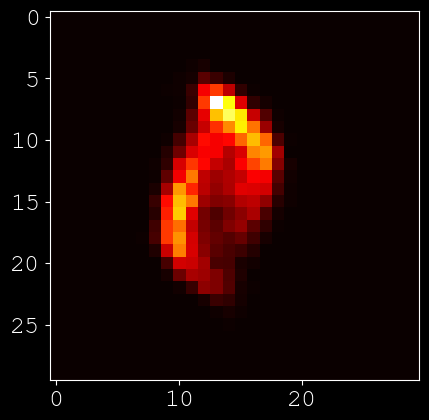

In [219]:

plt.imshow(p_recon_list[0], cmap='hot', interpolation='nearest')
for i in range(11):
    print(np.sum(p_recon_list[i]))

30

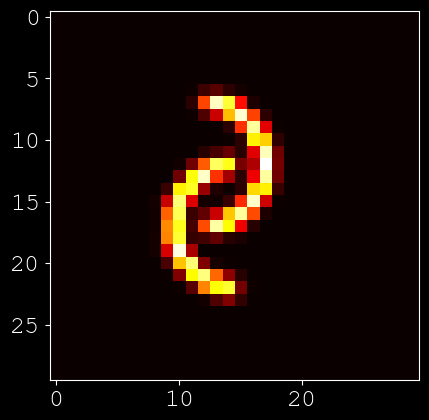

In [31]:
# import csv
# with open('data.csv') as fd:
#     reader=csv.reader(fd, delimiter=' ')
#     interestingrows= np.array([row for idx, row in enumerate(reader) if idx in range(0,30)])
#     interestingrows = interestingrows.astype(float)
# #print(interestingrows[0][0]+1)
# plt.imshow(interestingrows, cmap='hot', interpolation='nearest')
# len(interestingrows)

In [142]:
np.sum(collector)

1.0

## Animation

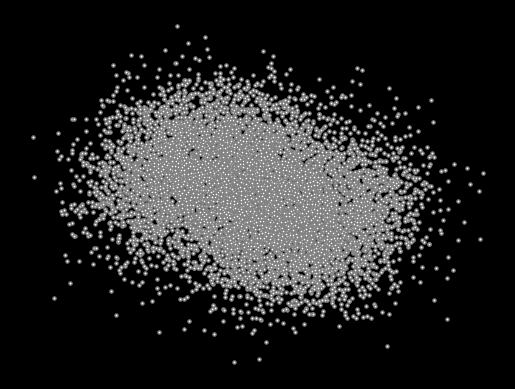

In [7]:
# Generating the forward image sequence

import io
from PIL import Image

imgs = []
#fig, axs = plt.subplots(1, 10, figsize=(28, 3))
for i in range(100):
    plt.clf()
    q_i = q_x(dataset, torch.tensor([i]))
    plt.scatter(q_i[:, 0], q_i[:, 1],color='white',edgecolor='gray', s=5);
    plt.axis('off'); 
    
    img_buf = io.BytesIO()
    plt.savefig(img_buf, format='png')
    img = Image.open(img_buf)
    imgs.append(img)
    

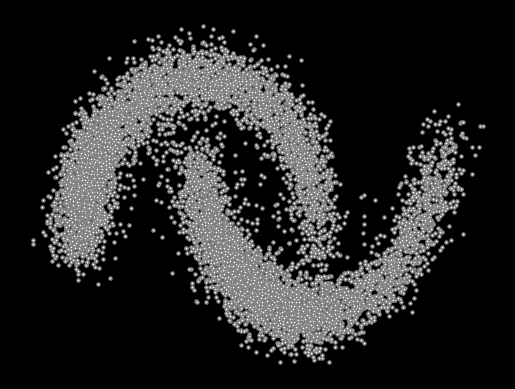

In [8]:
# Generating the reverse diffusion sequence

reverse = []
for i in range(100):  
    plt.clf()
    cur_x = x_seq[i].detach()
    plt.scatter(cur_x[:, 0], cur_x[:, 1],color='white',edgecolor='gray', s=5);
    plt.axis('off')
    
    img_buf = io.BytesIO()
    plt.savefig(img_buf, format='png')
    img = Image.open(img_buf)
    reverse.append(img)

In [9]:
imgs = imgs + reverse

In [10]:
imgs[0].save("diffusion.gif", format='GIF', append_images=imgs,save_all=True, duration=100, loop=0)

# References

[1] Ho, J., Jain, A., & Abbeel, P. (2020). Denoising diffusion probabilistic models. arXiv preprint arXiv:2006.11239.

[2] Sohl-Dickstein, J., Weiss, E. A., Maheswaranathan, N., & Ganguli, S. (2015). Deep unsupervised learning using nonequilibrium thermodynamics. arXiv preprint arXiv:1503.03585.